In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
import datetime as dt
import mplfinance as mpf

In [2]:
import functions as ff

In [3]:
import requests

## getting stocklist; combined s&p with NASDAQ (mkt. cap > 300m)

In [4]:
import glob

stocklist = []
for file in glob.glob('../data/STOCKLISTS/*.csv'):
    df = pd.read_csv(file)
    stocklist.extend(df['Symbol'])
    
len(stocklist)

2615

# batch API calls to parse fundamental data for stocks in stocklist

In [5]:
def make_data(lst,endpoint='quote',n=100, ):
    batches = []
    dataframe = dict()

    for i in range(0, len(lst), n):
        batches.append(",".join(lst[i:i+n]))
    


    b = []
    for string in batches:
        _ = ff.batch_API_call(string, endpoint)
        b.append(_)

    for idx, element in enumerate(b):
    #     print(type(element)) # 27 batches of dictionaries.
        stocks_in_section = list(element.keys())

        for stock in stocks_in_section:
            dataframe[stock] = element[stock][endpoint]


    return dataframe

### Parsing stats, quote, fundamentals, and cashflow endpoints

In [7]:
stats = make_data(stocklist, 'stats')
stats = pd.DataFrame(stats).T
stats

In [8]:
quote = make_data(stocklist, 'quote')
quote = pd.DataFrame(quote).T
quote

In [11]:
fundamentals = make_data(stocklist, 'fundamentals')
_ = dict()
# counter = 0
for key, x in fundamentals.items():

    if len(x) == 2:
#         counter+=1
        _[key] = x['fundamentals'][0]
fundamentals = pd.DataFrame(_).T

In [13]:
cashflow = make_data(stocklist, 'cash-flow')
_ = dict()
# counter = 0
for key, x in cashflow.items():

    if len(x) == 2:
#         counter+=1
        _[key] = x['cashflow'][0]
cashflow = pd.DataFrame(_).T

In [14]:
print(len(quote), len(cashflow), len(fundamentals), len(stats))

2466 1373 1373 2466


### joining endpoints based on available data

In [15]:
myset = cashflow.index

In [16]:
df = pd.concat([cashflow, fundamentals, quote[quote.index.isin(myset)], stats[stats.index.isin(myset)]], axis=1)

In [17]:
df.columns

Index(['capitalExpenditures', 'cashChange', 'cashFlow', 'cashFlowFinancing',
       'changesInInventories', 'changesInReceivables', 'currency',
       'depreciation', 'dividendsPaid', 'exchangeRateEffect',
       ...
       'maxChangePercent', 'year5ChangePercent', 'year2ChangePercent',
       'year1ChangePercent', 'ytdChangePercent', 'month6ChangePercent',
       'month3ChangePercent', 'month1ChangePercent', 'day30ChangePercent',
       'day5ChangePercent'],
      dtype='object', length=299)

### calculating features

In [63]:
ser = df[['year5ChangePercent', 'year2ChangePercent',
       'year1ChangePercent', 'ytdChangePercent', 'month6ChangePercent',
       'month3ChangePercent', 'month1ChangePercent', 'day30ChangePercent',
       'day5ChangePercent']].mean(axis=1)
normalized_ser=(ser-ser.min())/(ser.max()-ser.min())
df['hqm score'] = normalized_ser

df['pct_below_above_50_200'] = (df['day200MovingAvg'] -df['day50MovingAvg']) / df['previousClose'] * 100

# Writing df to File

In [64]:
df.to_csv('stats-quote-fundamentals-cashflow-sp500-nasdaq.csv')

# Filtering and adding data

In [65]:
# filtering columns
test = df[['marketcap','day200MovingAvg', 'day50MovingAvg', 'totalCashFlow', 'previousClose', 'year5ChangePercent', 'year2ChangePercent',
       'year1ChangePercent', 'ytdChangePercent', 'month6ChangePercent',
       'month3ChangePercent', 'month1ChangePercent', 'day30ChangePercent',
       'day5ChangePercent']]


### attempting to generate cash flow : price ratio...

In [48]:
ser = test['previousClose']/test['totalCashFlow']
ser.astype(float).nlargest(10)

STKL     0.001348
FNLC     0.000925
WAB      0.000449
MSTR     0.000397
LULU     0.000384
TECH     0.000285
SEDG     0.000208
FCFS     0.000203
ARTNA    0.000177
LNTH     0.000146
dtype: float64

In [77]:
# finally, filtering based on set conditions; 500m market cap, 50>200sma, price > 6$
cond1 = test[(test['marketcap']>500000000) & (test['day200MovingAvg'] <= test['day50MovingAvg']) & (test['previousClose'] > 6)]

C:\Users\polan\AppData\Local\Temp/ipykernel_17112/1508243518.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['hqm score'] = normalized_ser


In [125]:
investigate = cond1['hqm score'].nlargest(25)
investigate

ENPH    1.000000
APPS    0.594639
EXPI    0.556628
TNDM    0.368895
ARWR    0.319485
TSLA    0.268209
TTD     0.239853
PLUG    0.216807
OPCH    0.193454
CROX    0.187080
ATLC    0.184838
CAR     0.174285
SEDG    0.173402
ETSY    0.163450
NVDA    0.149140
MDB     0.140844
UPST    0.135398
CDMO    0.129573
AMD     0.128270
TEAM    0.126572
LSCC    0.116215
ZS      0.114990
INVE    0.114814
ACMR    0.113974
TRUP    0.111204
Name: hqm score, dtype: float64

In [136]:
a = ff.get_stock('ENPH', start='2016-03-01')[1]

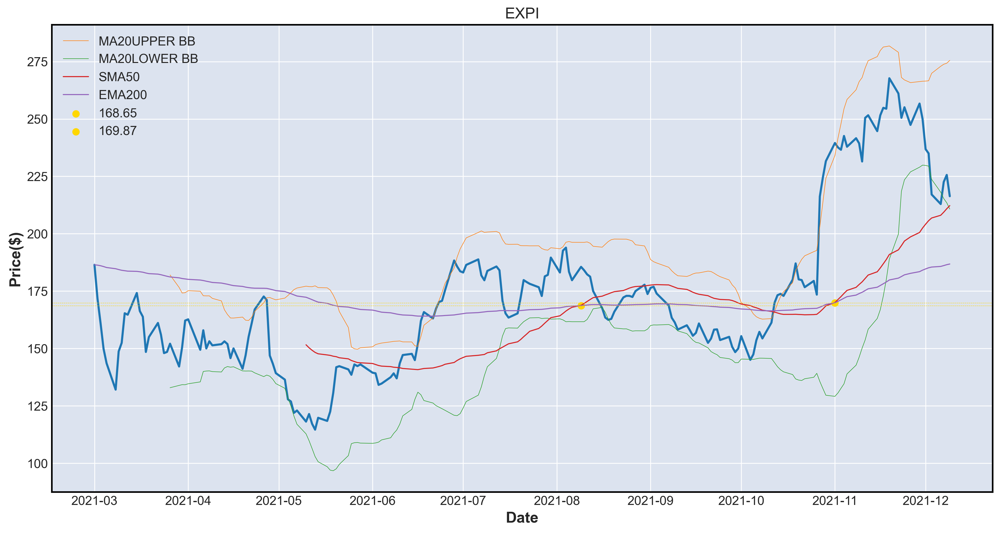

In [135]:
plt.figure(figsize=(16,8))
plt.title(f'{stock}')
plt.xlabel('Date')
plt.ylabel('Price($)')
plt.plot(a['Adj Close'])
upp, low = ff.add_bb(a, return_bb=True, plot_bb=True)

a['upper'] = upp
a['lower'] = low

ff.add_ma(a, 50, add_col=True, return_ma=False, plot_ma=True)
ff.add_ma(a, 200, add_col=True, kind='e', return_ma=False, plot_ma=True)

ff.find_gold(a, 'SMA50', 'EMA200',plot_ups=True)

plt.legend()
plt.show()

In [134]:
plt.rcParams['figure.dpi'] = 300

In [140]:
len(figs)

3

In [141]:
for stock in list(investigate.index):


    try:
        figs[stock] = ff.get_stock(stock, start='2016-09-01')[1]
    except:
        pass

C:\Users\polan\AppData\Local\Temp/ipykernel_17112/141706265.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,8))


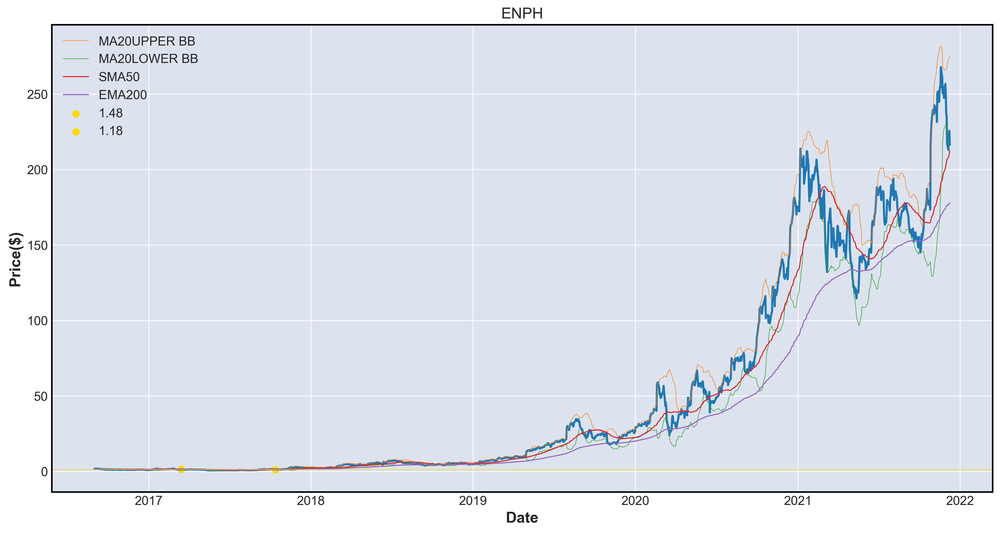

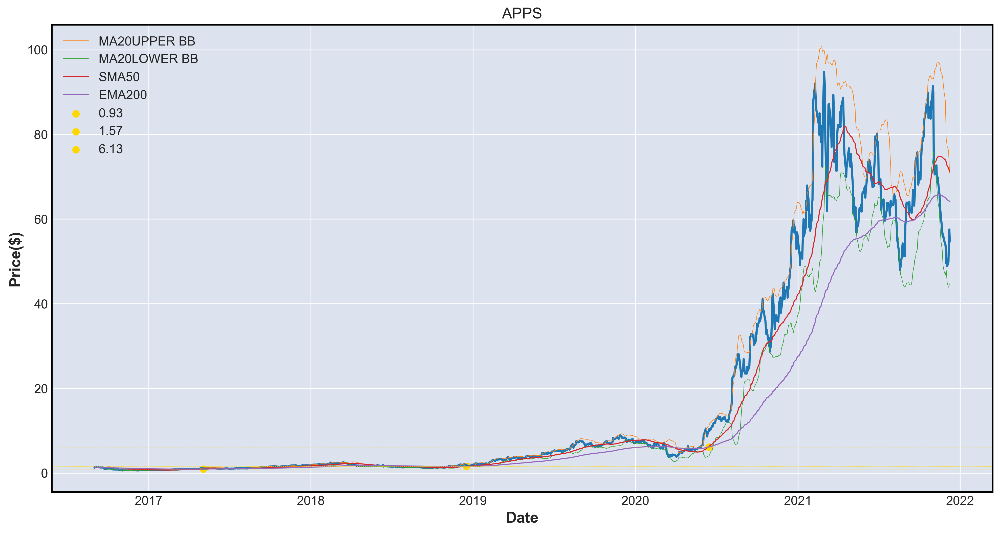

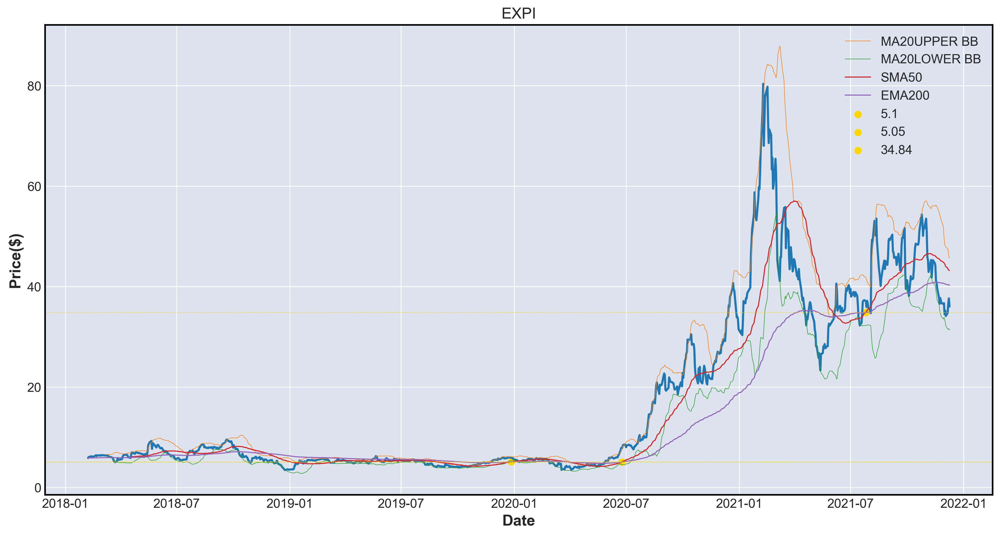

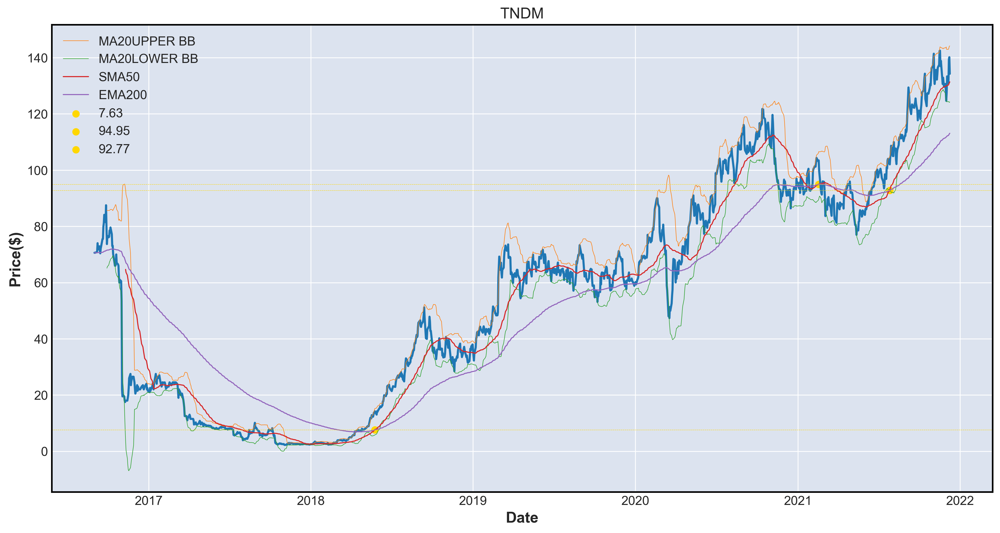

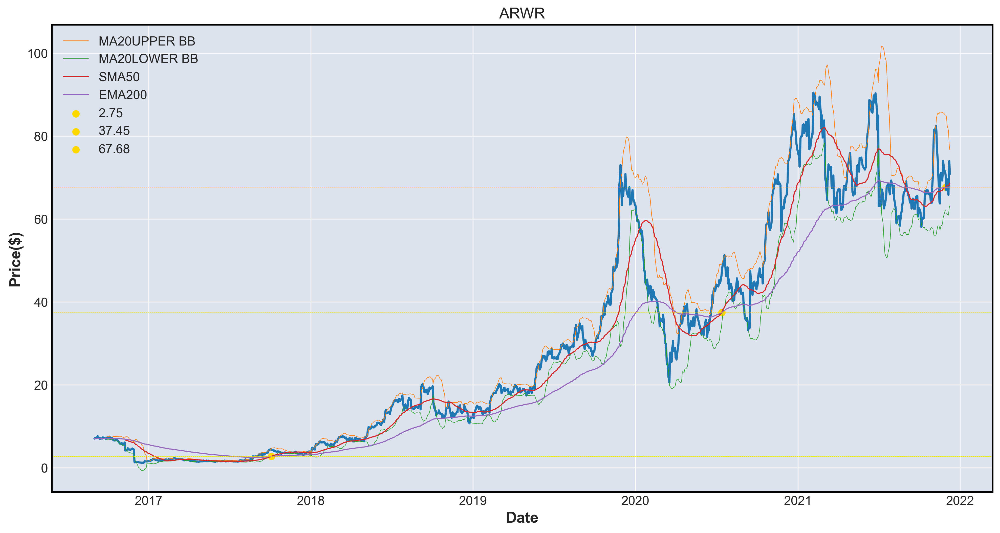

...

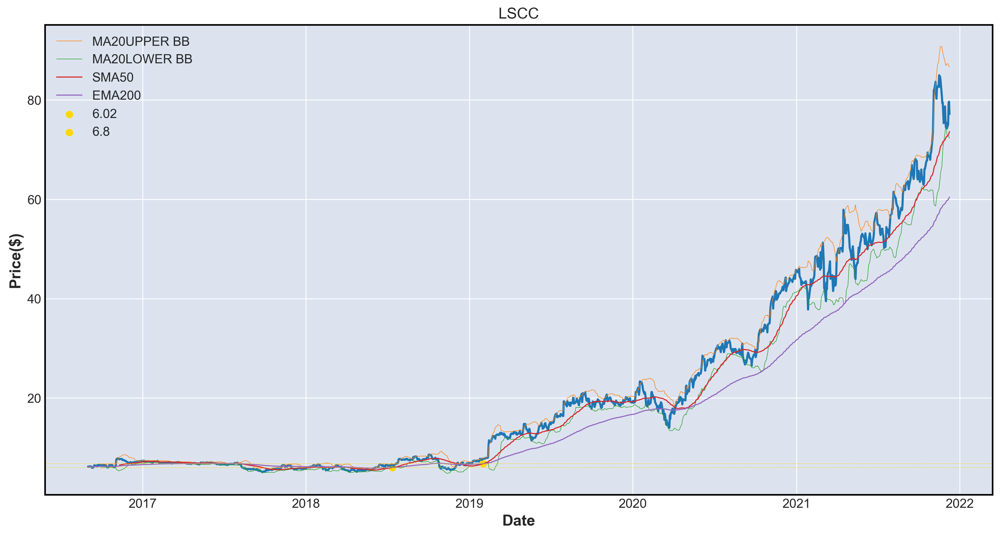

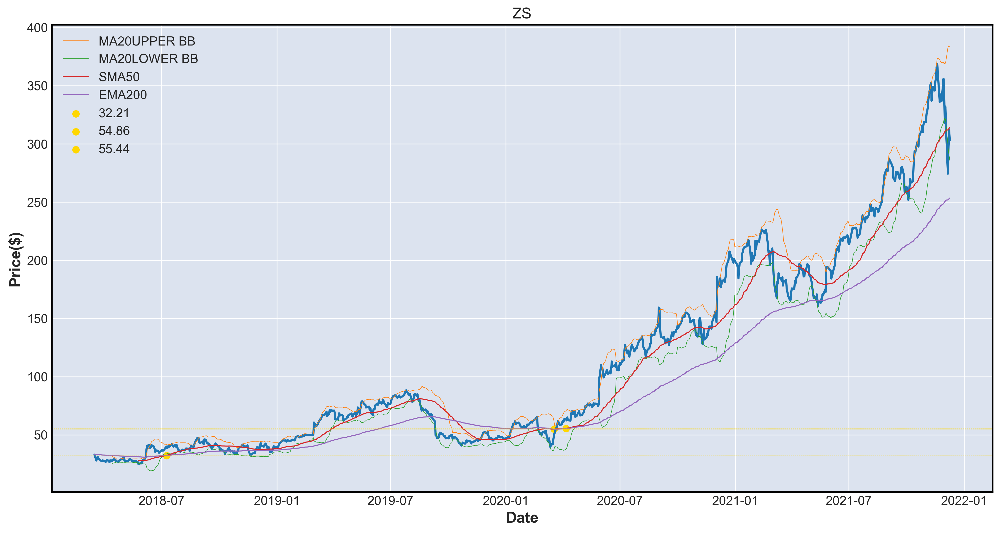

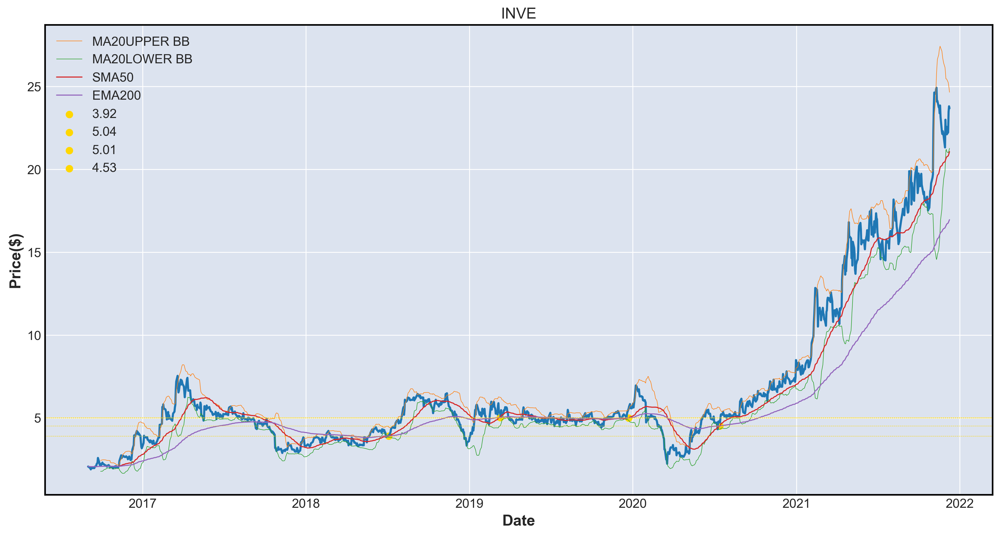

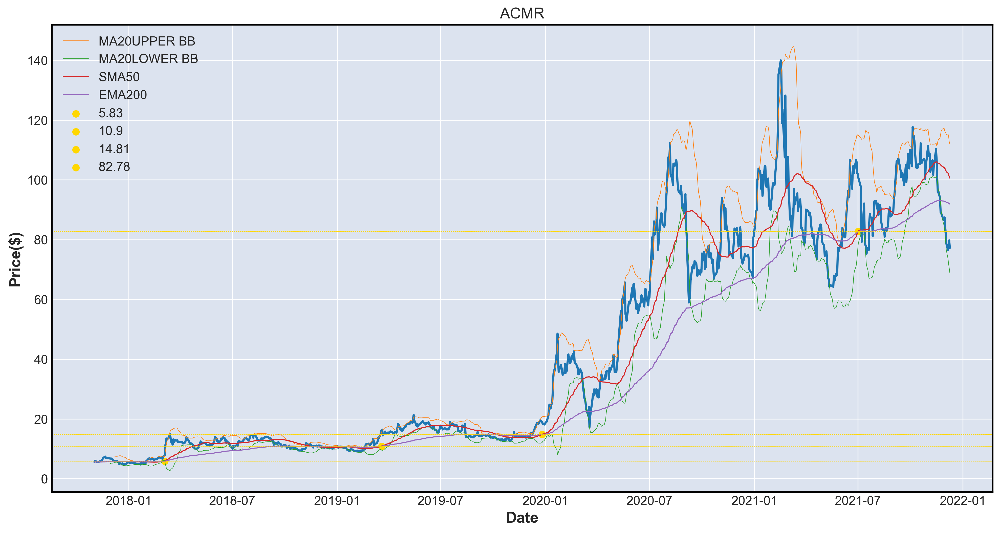

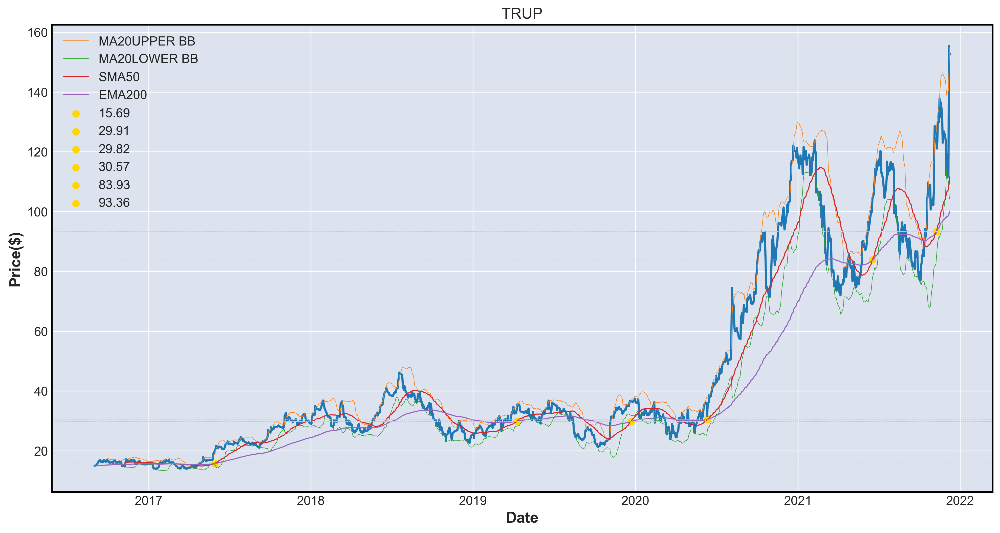

In [142]:

for stock, a in figs.items():
    plt.figure(figsize=(16,8))
    plt.title(f'{stock}')
    plt.xlabel('Date')
    plt.ylabel('Price($)')

    plt.plot(a['Adj Close'])
    upp, low = ff.add_bb(a, return_bb=True, plot_bb=True)

    a['upper'] = upp
    a['lower'] = low

    ff.add_ma(a, 50, add_col=True, return_ma=False, plot_ma=True)
    ff.add_ma(a, 200, add_col=True, kind='e', return_ma=False, plot_ma=True)

    ff.find_gold(a, 'SMA50', 'EMA200',plot_ups=True)

    plt.legend()
    plt.savefig(f'PLOTTING/{stock}.png')
    print(f'finished printing {stock}.', end='\r')